# Assignment 1 on Image Classification using CNN

## Name: AShim Nepal, L6CG9
## Student ID: 2329760

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Importing all required libraries for the task
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf
import seaborn as sns
import pandas as pd
from collections import Counter
from PIL import Image
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report

In [ ]:
ds_path = "/content/drive/MyDrive/Sem6/AI_ML/assignment_dataset/Flower Classification/Train" # Images dataset path

In [ ]:
#initializing variable to store the total number of images
total_images = 0
for root, dirs, files in os.walk(ds_path):
  # Count the number of files in each directory
  num_files = len(files)
  total_images += num_files
print("Total number of images:", total_images)

# Count images per class
classes = os.listdir(ds_path)
images_per_class = {}
for class_name in classes:
  class_path = os.path.join(ds_path, class_name)
  if os.path.isdir(class_path):
    images_per_class[class_name] = len(os.listdir(class_path))
print("Total number of images per classes:", images_per_class)



Total number of images: 4277
Total number of images per classes: {'tulip': 976, 'dandelion': 1044, 'rose': 776, 'daisy': 756, 'sunflower': 725}


In [ ]:
import os
# Number of classes in dataset
class_names = sorted(os.listdir(ds_path))
if not class_names:
  print("No class directories found in the train folder!")
else:
  print(f"Found {len(class_names)} classes: {class_names}")

Found 5 classes: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


In [ ]:
from PIL import Image, UnidentifiedImageError

# Checking for corrupt images in dataset
corrupted_images = []

for class_name in class_names:
    class_path = os.path.join(ds_path, class_name)
    print(f"Checking in: {class_path}")

    if os.path.isdir(class_path):
        images = os.listdir(class_path)
        for img_name in images:
            img_path = os.path.join(class_path, img_name)
            try:
                with Image.open(img_path) as img:
                    img.verify()
            except (IOError, UnidentifiedImageError):
                corrupted_images.append(img_path)
                print(f"Corrupted image detected: {img_path}")
                try:
                    os.remove(img_path)
                    print(f"Deleted: {img_path}")
                except Exception as e:
                    print(f"Failed to delete {img_path}: {e}")

# Summary of the corrupt images if found
if corrupted_images:
    print(f"\nTotal corrupted images deleted: {len(corrupted_images)}")
else:
    print("\nNo corrupted images found.")


Checking in: /content/drive/MyDrive/Sem6/AI_ML/assignment_dataset/Flower Classification/Train/daisy
Checking in: /content/drive/MyDrive/Sem6/AI_ML/assignment_dataset/Flower Classification/Train/dandelion
Checking in: /content/drive/MyDrive/Sem6/AI_ML/assignment_dataset/Flower Classification/Train/rose
Checking in: /content/drive/MyDrive/Sem6/AI_ML/assignment_dataset/Flower Classification/Train/sunflower
Checking in: /content/drive/MyDrive/Sem6/AI_ML/assignment_dataset/Flower Classification/Train/tulip

No corrupted images found.


Note*: There were 35 corrupt images initially on the dataset, but re running this code block made the output to provide 0 corrupt images. But originally the number of corrupt images is 35.

In [ ]:
from collections import Counter

# Defining a function to get image resolution for all images
def image_shapes_summary(directory):
    shapes = []
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        for image_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, image_name)
            try:
                with Image.open(img_path) as img:
                    shapes.append(img.size)
            except:
                pass
    shape_counts = Counter(shapes)
    print("Image sizes and their frequencies:")
    for shape, count in shape_counts.items():
        print(f"{shape}: {count} images")

image_shapes_summary(ds_path)

Image sizes and their frequencies:
(320, 254): 9 images
(180, 240): 153 images
(320, 218): 10 images
(500, 335): 27 images
(500, 331): 54 images
(320, 240): 595 images
(240, 240): 217 images
(320, 213): 320 images
(240, 159): 373 images
(240, 192): 10 images
(500, 333): 597 images
(320, 211): 13 images
(159, 240): 139 images
(320, 266): 5 images
(500, 281): 48 images
(240, 239): 7 images
(500, 332): 118 images
(500, 372): 2 images
(320, 212): 44 images
(182, 240): 3 images
(214, 240): 4 images
(320, 264): 4 images
(209, 240): 2 images
(240, 218): 4 images
(500, 336): 4 images
(500, 327): 6 images
(500, 300): 3 images
(500, 273): 1 images
(500, 321): 4 images
(500, 310): 2 images
(320, 215): 8 images
(320, 232): 9 images
(500, 375): 121 images
(1024, 187): 1 images
(240, 150): 6 images
(320, 220): 8 images
(500, 322): 9 images
(163, 240): 3 images
(320, 221): 6 images
(196, 240): 3 images
(320, 214): 12 images
(500, 314): 5 images
(500, 315): 5 images
(240, 230): 3 images
(171, 240): 3 

In [ ]:
# Since the sizes were irregular, getting the average of width and height for all images
# Step 1: Extract image sizes
def get_image_shapes(directory):
    shapes = []
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            for image_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, image_name)
                try:
                    with Image.open(img_path) as img:
                        shapes.append(img.size)  # (width, height)
                except:
                    pass
    return Counter(shapes)

# Step 2: Analyze and visualize
def analyze_and_plot_image_shapes(directory):
    shape_counts = get_image_shapes(directory)

    if not shape_counts:
        print("No valid image shapes found.")
        return

    # Convert to DataFrame
    data = []
    for (w, h), count in shape_counts.items():
        data.append([w, h, count])
    df = pd.DataFrame(data, columns=["width", "height", "count"])

    # Calculate weighted average width and height
    total_images = df["count"].sum()
    avg_width = int((df["width"] * df["count"]).sum() / total_images)
    avg_height = int((df["height"] * df["count"]).sum() / total_images)
    print(f"\n Suggested resize dimensions: ({avg_width}, {avg_height})")

    # Plot: Scatter plot of sizes
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df, x="width", y="height", size="count",
                    sizes=(40, 600), alpha=0.7, legend=False)
    plt.scatter(avg_width, avg_height, color='red', s=300, edgecolors='black', label=f"Suggested Avg Size ({avg_width}, {avg_height})")
    plt.title("Image Size Distribution")
    plt.xlabel("Width (pixels)")
    plt.ylabel("Height (pixels)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()




 Suggested resize dimensions: (338, 253)


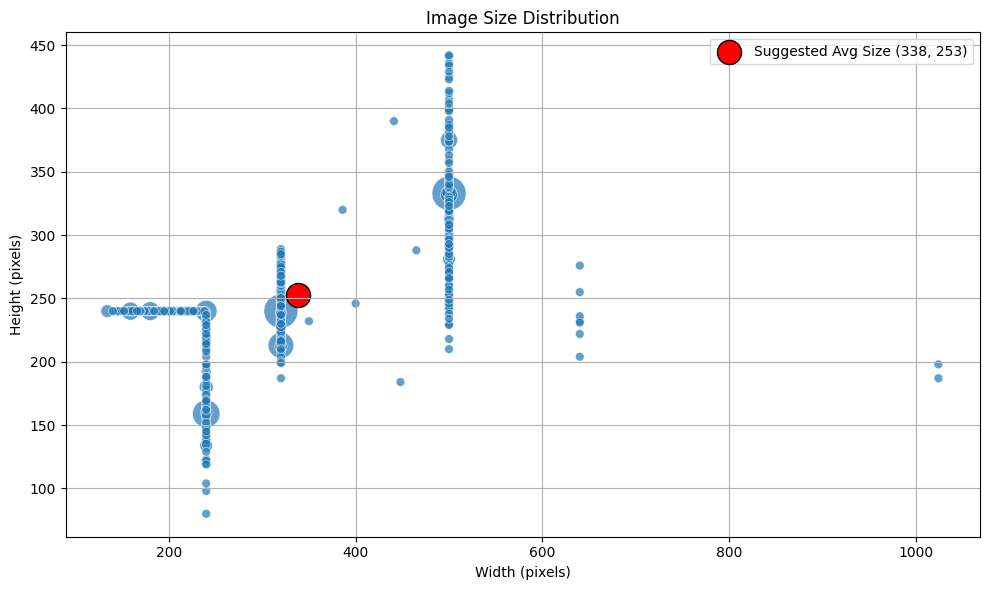

In [ ]:
analyze_and_plot_image_shapes(ds_path)

In [ ]:
import shutil
from tqdm import tqdm
from sklearn.model_selection import train_test_split

In [ ]:
# Splitting the data into training and testing, 90% on training and 10 percent to test folder on new directory
# Defining all required paths
original_data_dir = '/content/drive/MyDrive/Sem6/AI_ML/assignment_dataset/Flower Classification/Train'
output_base_dir = '/content/drive/MyDrive/Sem6/AI_ML/assignment_dataset/resized_Dataset'
train_output_dir = os.path.join(output_base_dir, 'train')
test_output_dir = os.path.join(output_base_dir, 'test')

# Target resize sized to 300 x 300 based on previous code block observation
target_size = (300, 300)

# Ensure output folders exist
for folder in [train_output_dir, test_output_dir]:
    os.makedirs(folder, exist_ok=True)

# Process each class folder
for class_name in os.listdir(original_data_dir):
    class_dir = os.path.join(original_data_dir, class_name)
    if not os.path.isdir(class_dir):
        continue

    # Collect all image paths
    image_paths = [os.path.join(class_dir, fname) for fname in os.listdir(class_dir)
                   if fname.lower().endswith(('.jpg', '.jpeg', '.png'))]

    # Split into train and test (90% - 10%)
    train_imgs, test_imgs = train_test_split(image_paths, test_size=0.1, random_state=42)

    # Create class subfolders in train and test
    train_class_dir = os.path.join(train_output_dir, class_name)
    test_class_dir = os.path.join(test_output_dir, class_name)
    os.makedirs(train_class_dir, exist_ok=True)
    os.makedirs(test_class_dir, exist_ok=True)

    # Resize and save training images
    for img_path in tqdm(train_imgs, desc=f'Resizing train {class_name}'):
        try:
            img = Image.open(img_path).convert('RGB')
            img_resized = img.resize(target_size)
            img_resized.save(os.path.join(train_class_dir, os.path.basename(img_path)))
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

    # Resize and save testing images
    for img_path in tqdm(test_imgs, desc=f'Resizing test {class_name}'):
        try:
            img = Image.open(img_path).convert('RGB')
            img_resized = img.resize(target_size)
            img_resized.save(os.path.join(test_class_dir, os.path.basename(img_path)))
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

print("\nDataset has been resized and split into training and testing sets.")
print(f"Train dir: {train_output_dir}")
print(f"Test dir: {test_output_dir}")

Resizing test sunflower: 100%|██████████| 73/73 [00:01<00:00, 39.28it/s]


Dataset has been resized and split into training and testing sets.
Train dir: /content/drive/MyDrive/Sem6/AI_ML/assignment_dataset/resized_Dataset/train
Test dir: /content/drive/MyDrive/Sem6/AI_ML/assignment_dataset/resized_Dataset/test


In [ ]:
# Lets work on new dataset created for further tasks

resized_test_ds_path = "/content/drive/MyDrive/Sem6/AI_ML/assignment_dataset/resized_Dataset/test"

# Initialize a variable to store the total number of images on new test data
total_images = 0
for root, dirs, files in os.walk(resized_test_ds_path):

  num_files = len(files)
  total_images += num_files
print("Total number of images:", total_images)

# Count images per class
classes = os.listdir(resized_test_ds_path)
images_per_class = {}
for class_name in classes:
  class_path = os.path.join(resized_test_ds_path, class_name)
  if os.path.isdir(class_path):
    images_per_class[class_name] = len(os.listdir(class_path))
print("Total number of images per classes:", images_per_class)



Total number of images: 430
Total number of images per classes: {'tulip': 98, 'dandelion': 105, 'rose': 78, 'daisy': 76, 'sunflower': 73}


In [ ]:
resized_train_ds_path = "/content/drive/MyDrive/Sem6/AI_ML/assignment_dataset/resized_Dataset/train"

# Initialize a variable to store the total number of images on new training data
total_images = 0
for root, dirs, files in os.walk(resized_train_ds_path):

  num_files = len(files)
  total_images += num_files
print("Total number of images:", total_images)

# Count images per class in training directory
classes = os.listdir(resized_train_ds_path)
images_per_class = {}
for class_name in classes:
  class_path = os.path.join(resized_train_ds_path, class_name)
  if os.path.isdir(class_path):
    images_per_class[class_name] = len(os.listdir(class_path))
print("Total number of images per classes:", images_per_class)



Total number of images: 3847
Total number of images per classes: {'tulip': 878, 'dandelion': 939, 'rose': 698, 'daisy': 680, 'sunflower': 652}


In [ ]:
# Setting training dataset splitted along with validation set
train_ds = tf.keras.utils.image_dataset_from_directory(
resized_train_ds_path,
batch_size=32,
image_size=(300, 300),
shuffle=True,
seed=123,
validation_split=0.2,
subset="training",
)

Found 3847 files belonging to 5 classes.
Using 3078 files for training.


In [ ]:
# Setting validation dataset splitted along with trqaining set
val_ds = tf.keras.utils.image_dataset_from_directory(
resized_train_ds_path,
batch_size=32,
image_size=(300, 300),
shuffle=True,
seed=123,
validation_split=0.2,
subset="validation",
)

Found 3847 files belonging to 5 classes.
Using 769 files for validation.


In [ ]:
# Creating the Augmentation with keras
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
])

In [ ]:
import os
class_names = sorted(os.listdir(resized_train_ds_path))
if not class_names:
  print("No class directories found in the train folder!")
else:
  print(f"Found {len(class_names)} classes: {class_names}")

Found 5 classes: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


In [ ]:
# Displaying the visualization of random images from dataset/augmented dataset
def show_augmented_images(dataset, data_augmentation, class_names):
    plt.figure(figsize=(12, 12))

    for images, labels in dataset.take(1):
        augmented_images = data_augmentation(images)

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(augmented_images[i].numpy().astype("uint8"))
            plt.title(f"Class: {class_names[labels[i].numpy()]}")
            plt.axis("off")

    plt.tight_layout()
    plt.show()

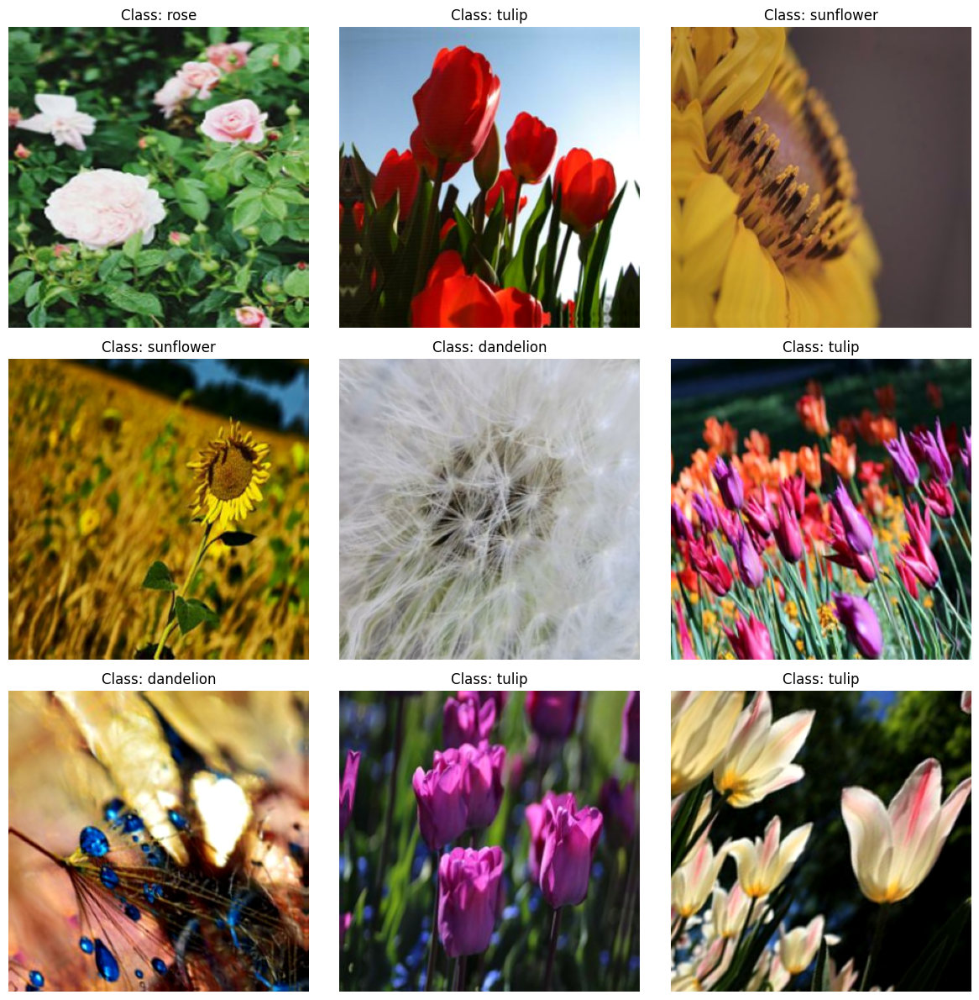

In [ ]:
show_augmented_images(train_ds, data_augmentation, class_names)

<ipython-input-12-8a733c643393>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=data["Class"], y=data["Number of Images"], palette="Set2")


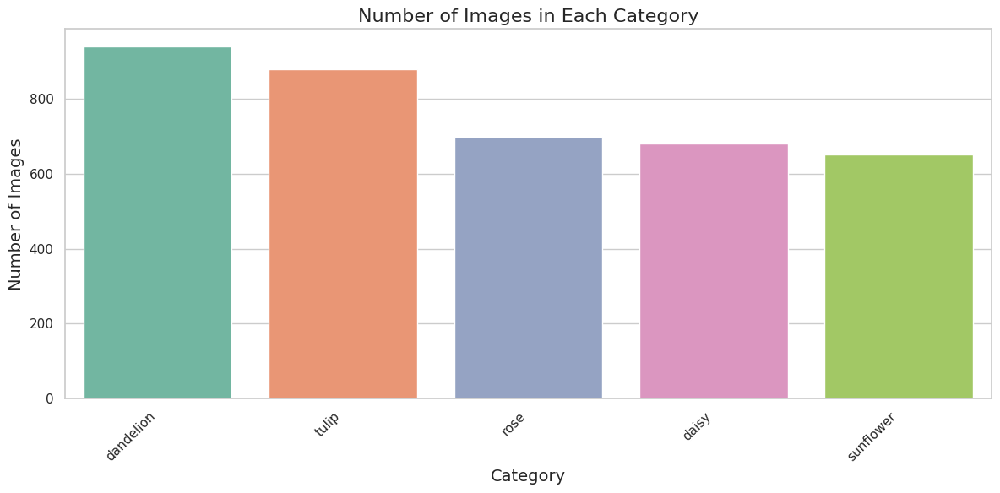

In [ ]:
# Function to create a bar graph to show the distribution of flowers on each class.

def plot_image_category_distribution(directory):
    categories = []

    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            num_images = len([image_name for image_name in os.listdir(class_dir) if image_name.lower().endswith('.jpg')])
            categories.append((class_name, num_images))

    categories.sort(key=lambda x: x[1], reverse=True)

    class_names, image_counts = zip(*categories)

    data = {"Class": class_names, "Number of Images": image_counts}

    sns.set(style="whitegrid", palette="muted")

    plt.figure(figsize=(12, 6))
    sns.barplot(x=data["Class"], y=data["Number of Images"], palette="Set2")

    plt.xticks(rotation=45, ha="right")

    plt.title("Number of Images in Each Category", fontsize=16)
    plt.xlabel("Category", fontsize=14)
    plt.ylabel("Number of Images", fontsize=14)

    plt.tight_layout()
    plt.show()

plot_image_category_distribution(resized_train_ds_path)


## Model 1: Baseline CNN

In [ ]:
# Function to create a simple CNN model

def generate_model(image_height, image_width, nchannels, num_classes):

  baseline_model = tf.keras.Sequential([
      data_augmentation,
      # Rescaling and input layer
      layers.Rescaling(1./255, input_shape=(image_height,image_width, nchannels)),
      # First Block of Convolution and Pooling Operations.
      layers.Conv2D(32, (3,3), padding="same", activation="relu"),
      layers.MaxPooling2D(2,2),
      # Second Block of Convolution and Pooling Operations.
      layers.Conv2D(64, (3,3), padding="same", activation="relu"),
      layers.MaxPooling2D(2,2),
      # Third Block of Convolution and Pooling Operations.
      layers.Conv2D(128, (3,3), padding="same", activation="relu"),
      layers.MaxPooling2D(2,2),

      # Fully connected classifier.
      layers.Flatten(),
      layers.Dense(128, activation="relu"),
      layers.Dense(64, activation='relu'),
      layers.Dense(32, activation='relu'),
      layers.Dense(num_classes, activation='softmax')
  ])
  return baseline_model

In [ ]:
# Setting hyper parameter values
batch_size = 32
img_height = 300
img_width = 300
dropout_rate = 0.2

In [ ]:
num_classes = len(class_names)
baseline_model = generate_model(img_height, img_width, 3, num_classes) # Creating the model

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


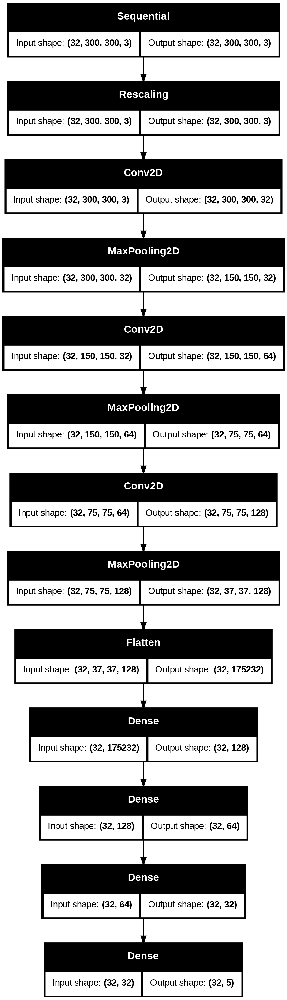

In [ ]:
keras.utils.plot_model(baseline_model, show_shapes=True) # Model architecture chart

In [ ]:
# Encoding the train and validation data
train_ds = train_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))
val_ds = val_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))

In [ ]:
baseline_model.compile(loss="categorical_crossentropy",optimizer="adam",metrics=["accuracy"]) # Compiling baseline model

In [ ]:
baseline_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (32, 300, 300, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (32, 150, 150, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (32, 75, 75, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (32, 175232)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (32, 128)              │    22,429,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (32, 64)               │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (32, 32)               │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (32, 5)                │           165 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,533,573 (85.96 MB)

 Trainable params: 22,533,573 (85.96 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# declaring callbacks for making a good model
callbacks = [
keras.callbacks.ModelCheckpoint(filepath="model_at_epoch_{epoch}.keras"),
keras.callbacks.EarlyStopping(monitor="val_loss", patience=5 ),
]

In [ ]:
epochs = 30
# Training the model with 30 epochs
history = baseline_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[callbacks]
)

Epoch 1/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 1310s 14s/step - accuracy: 0.3143 - loss: 1.7088 - val_accuracy: 0.4616 - val_loss: 1.1880
Epoch 2/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - accuracy: 0.5403 - loss: 1.1148 - val_accuracy: 0.5709 - val_loss: 1.0401
Epoch 3/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - accuracy: 0.5986 - loss: 1.0061 - val_accuracy: 0.6086 - val_loss: 1.0030
Epoch 4/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - accuracy: 0.6325 - loss: 0.9779 - val_accuracy: 0.6411 - val_loss: 0.9416
Epoch 5/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - accuracy: 0.6649 - loss: 0.9191 - val_accuracy: 0.6697 - val_loss: 0.8395
Epoch 6/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 22s 168ms/step - accuracy: 0.6706 - loss: 0.8430 - val_accuracy: 0.6957 - val_loss: 0.8163
Epoch 7/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - accuracy: 0.6821 - loss: 0.8377 - val_accuracy: 0.6957 - val_loss: 0.8044
Epoch 8/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - accuracy: 0.7080 - loss: 0.7666 - val_accu

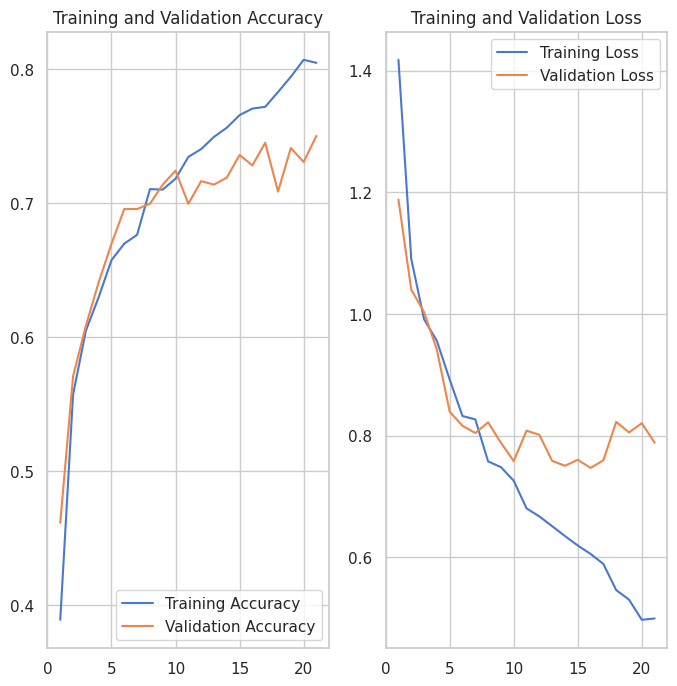

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

# Displaying the graph of train and validation loss/accuracy
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
test_loss, test_accuracy = baseline_model.evaluate(val_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - accuracy: 0.7502 - loss: 0.8433
Test Loss: 0.7884921431541443
Test Accuracy: 0.750325083732605


Found 430 files belonging to 5 classes.
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - accuracy: 0.7858 - loss: 0.6823 
Test Loss: 0.7915940880775452
Test Accuracy: 0.7558139562606812
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


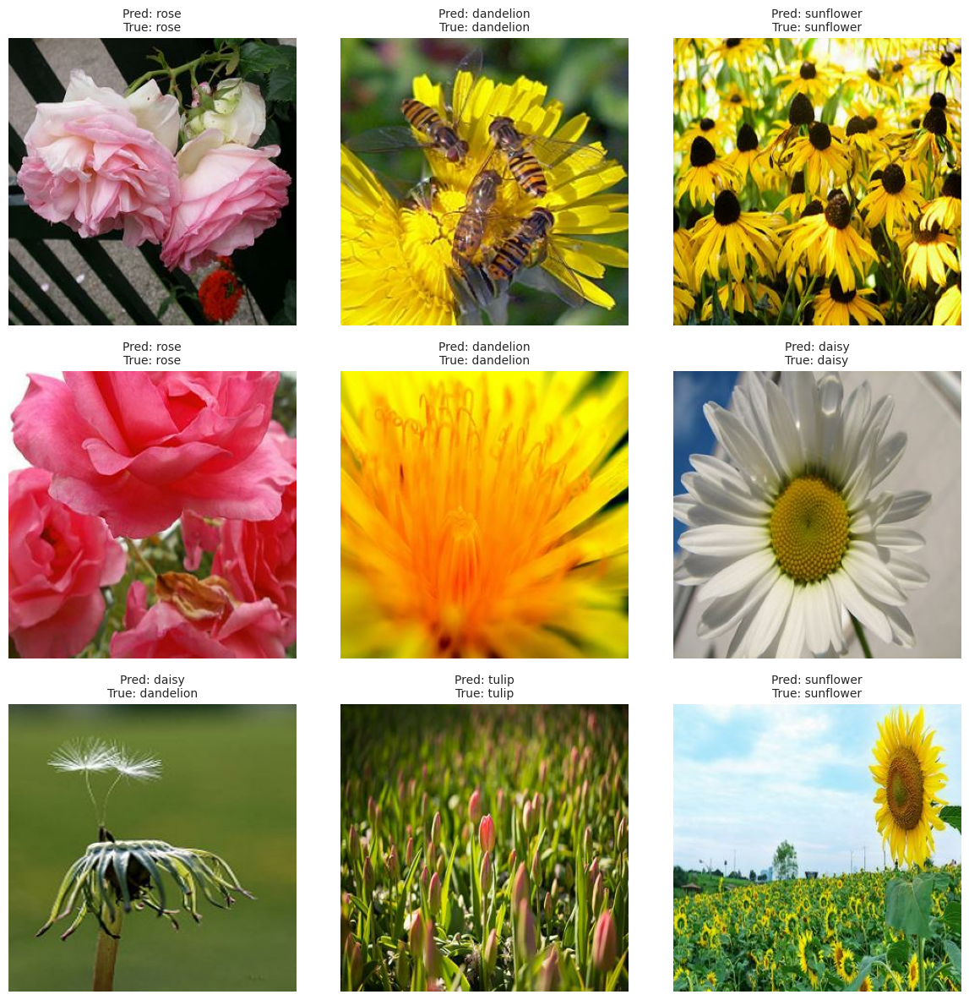

In [ ]:

# Function to predict input examples and plot the results
def predict_and_plot(model, dataset, class_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):
        # Predict the labels for the images
        predictions = model.predict(images)
        images = images.numpy()  # Convert images to NumPy arrays
        labels = labels.numpy()  # Convert labels to NumPy arrays

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].astype("uint8"))

            predicted_label = class_names[np.argmax(predictions[i])]


            true_label_index = np.argmax(labels[i])
            true_label = class_names[true_label_index]  # Converting to integer index

            plt.title(f"Pred: {predicted_label}\nTrue: {true_label}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

# Create test dataset
test_dir = "/content/drive/MyDrive/Sem6/AI_ML/assignment_dataset/resized_Dataset/test"
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    batch_size=32,
    image_size=(300, 300),
    shuffle=True
)
# Convert test_ds labels to one-hot encoded format
test_ds = test_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))

# Evaluate the model on the test dataset
test_loss, test_accuracy = baseline_model.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Predict and plot examples from the test set
predict_and_plot(baseline_model, test_ds, class_names)


In [ ]:
baseline_model.save('baseline_cnn.h5') # Saving the model

In [ ]:
# obtaining the classification report for the new model created
loaded_model = keras.models.load_model('baseline_cnn.h5')
print("Model loaded for predictions")

# Collect all test images and labels
all_images = []
all_labels = []
for images, labels in test_ds:
    all_images.append(images.numpy())
    all_labels.append(labels.numpy())

# Concatenate batches into single arrays
test_images = np.concatenate(all_images, axis=0)
test_labels_onehot = np.concatenate(all_labels, axis=0)

# Make predictions
predictions = loaded_model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_labels_onehot
if true_labels.ndim > 1:
    true_labels = np.argmax(true_labels, axis=1)


print(f"Class names: {class_names}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:\n", report)

Model loaded for predictions
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step
Class names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Report:
               precision    recall  f1-score   support

       daisy       0.82      0.64      0.72        76
   dandelion       0.76      0.82      0.79       105
        rose       0.72      0.65      0.68        78
   sunflower       0.85      0.84      0.84        73
       tulip       0.68      0.80      0.74        98

    accuracy                           0.76       430
   macro avg       0.77      0.75      0.75       430
weighted avg       0.76      0.76      0.75       430



## Model 2: Deeper Regularized CNN Model

In [ ]:
# Designing the deeper regularized model with batch norms and dropouts
def generate_model(image_height, image_width, nchannels, num_classes):

  regularized_model = tf.keras.Sequential([
      data_augmentation,
      # Rescaling and input layer
      layers.Rescaling(1./255, input_shape=(image_height,image_width, nchannels)),
      # First Block of Convolution and Pooling Operations.
      layers.Conv2D(32, (3,3), padding="same", activation="relu"),
      layers.BatchNormalization(),
      layers.MaxPooling2D(2,2),
      layers.Dropout(0.2),
      # Second Block of Convolution and Pooling Operations.
      layers.Conv2D(64, (3,3), padding="same", activation="relu"),
      layers.BatchNormalization(),
      layers.MaxPooling2D(2,2),
      layers.Dropout(0.2),
      # Third Block of Convolution and Pooling Operations.
      layers.Conv2D(128, (3,3), padding="same", activation="relu"),
      layers.BatchNormalization(),
      layers.MaxPooling2D(2,2),
      layers.Dropout(0.2),

      # Fourth Block of Convolution and Pooling Operations.
      layers.Conv2D(256, (3,3), padding="same", activation="relu"),
      layers.BatchNormalization(),
      layers.MaxPooling2D(2,2),
      layers.Dropout(0.2),

      # Fully connected classifier.
      layers.Flatten(),
      layers.Dense(256, activation='relu'),
      layers.BatchNormalization(),
      layers.Dense(128, activation="relu"),
      layers.BatchNormalization(),
      layers.Dense(64, activation='relu'),
      layers.Dropout(0.3),
      layers.Dense(num_classes, activation='softmax')
  ])
  return regularized_model

In [ ]:
num_classes = len(class_names)
regularized_model = generate_model(img_height, img_width, 3, num_classes)

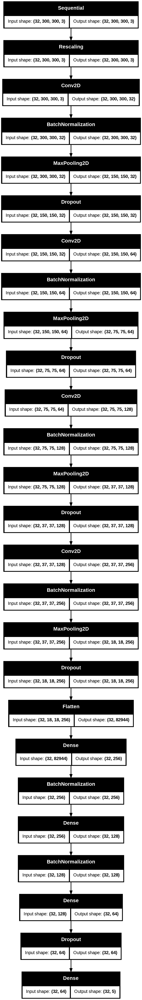

In [ ]:
keras.utils.plot_model(regularized_model, show_shapes=True)

In [ ]:
regularized_model.compile(loss="categorical_crossentropy",optimizer="sgd",metrics=["accuracy"]) # Compiling model with sgd optimizer

In [ ]:
regularized_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_2 (Rescaling)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (32, 300, 300, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (32, 300, 300, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (32, 150, 150, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (32, 150, 150, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (32, 75, 75, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (32, 75, 75, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (32, 37, 37, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (32, 37, 37, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (32, 18, 18, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (32, 18, 18, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (32, 82944)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (32, 256)              │    21,233,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (32, 256)              │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (32, 128)              │        32,896 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 21,667,269 (82.65 MB)

 Trainable params: 21,665,541 (82.65 MB)

 Non-trainable params: 1,728 (6.75 KB)

In [ ]:
epochs = 50
history = regularized_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[callbacks]
)

Epoch 1/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 37s 352ms/step - accuracy: 0.3601 - loss: 1.6310 - val_accuracy: 0.2380 - val_loss: 5.5175
Epoch 2/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 31s 312ms/step - accuracy: 0.5070 - loss: 1.2421 - val_accuracy: 0.2380 - val_loss: 9.4799
Epoch 3/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 318ms/step - accuracy: 0.5722 - loss: 1.1026 - val_accuracy: 0.2380 - val_loss: 9.8597
Epoch 4/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 31s 318ms/step - accuracy: 0.5768 - loss: 1.0562 - val_accuracy: 0.2653 - val_loss: 6.7028
Epoch 5/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 30s 313ms/step - accuracy: 0.6036 - loss: 1.0083 - val_accuracy: 0.2666 - val_loss: 7.4814
Epoch 6/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 31s 317ms/step - accuracy: 0.6167 - loss: 0.9850 - val_accuracy: 0.2783 - val_loss: 11.4055


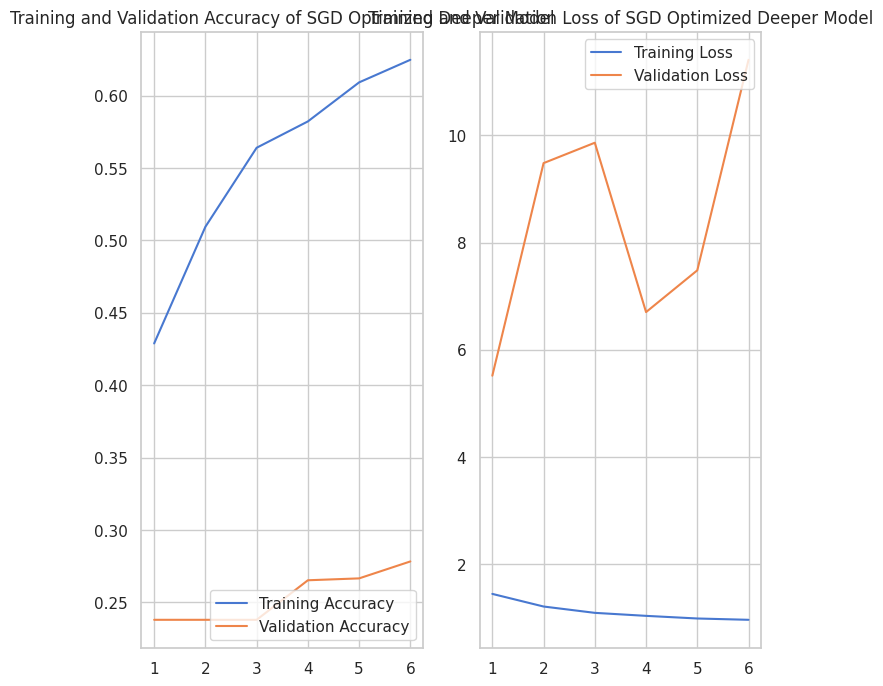

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy of SGD Optimized Deeper Model')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss of SGD Optimized Deeper Model')
plt.show()

In [ ]:
test_loss, test_accuracy = regularized_model.evaluate(val_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - accuracy: 0.2582 - loss: 11.2373
Test Loss: 11.405532836914062
Test Accuracy: 0.2782834768295288


14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - accuracy: 0.2782 - loss: 11.0940
Test Loss: 10.884437561035156
Test Accuracy: 0.27906978130340576
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


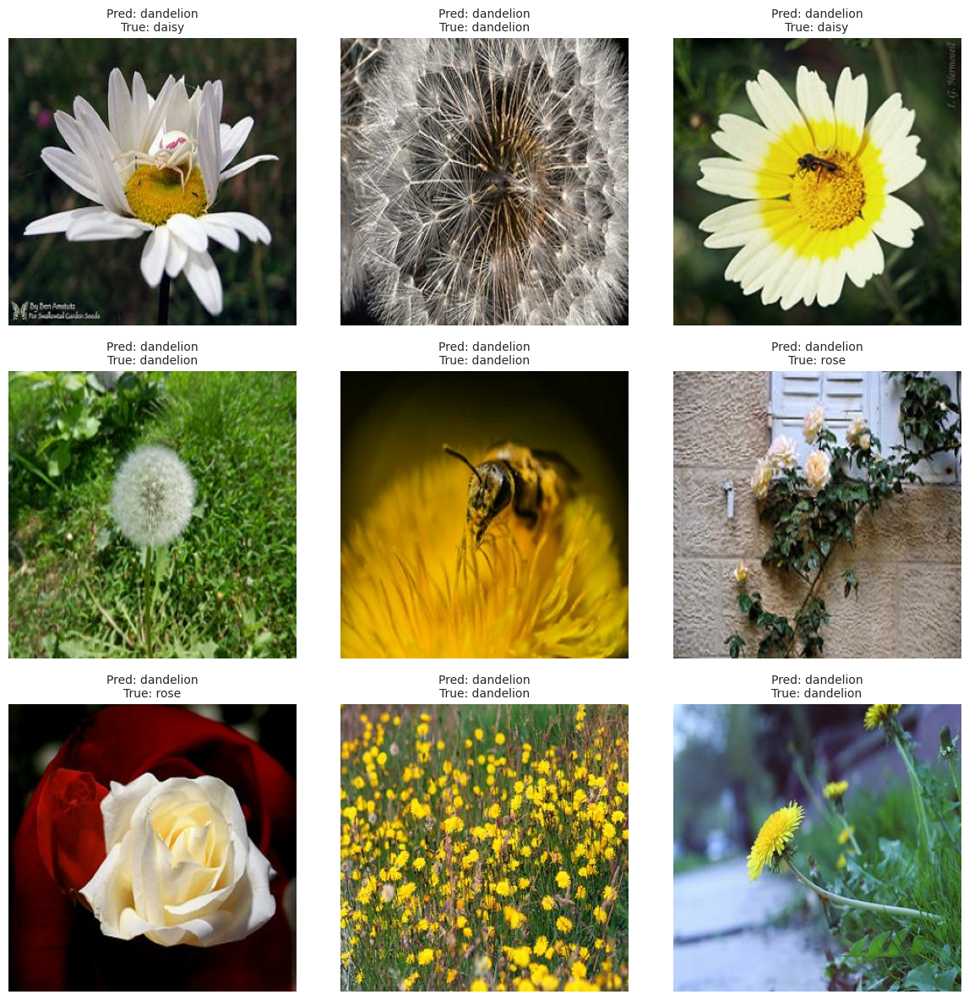

In [ ]:


def predict_and_plot(model, dataset, class_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):
        # Predict the labels for the images
        predictions = model.predict(images)
        images = images.numpy()  # Convert images to NumPy arrays
        labels = labels.numpy()  # Convert labels to NumPy arrays

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].astype("uint8"))

            predicted_label = class_names[np.argmax(predictions[i])]

            # Ensure labels[i] is an integer index
            true_label_index = np.argmax(labels[i])
            true_label = class_names[true_label_index]  # Convert to integer index

            plt.title(f"Pred: {predicted_label}\nTrue: {true_label}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

# Evaluate the model on the test dataset
test_loss, test_accuracy = regularized_model.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Predict and plot examples from the test set
predict_and_plot(regularized_model, test_ds, class_names)


In [ ]:
regularized_model.save('regularized_cnn_sgd.h5') # Saving model 2 sgd optimizer

In [ ]:
loaded_model = keras.models.load_model('regularized_cnn_sgd.h5')
print("Model loaded for predictions")

# Collect all test images and labels
all_images = []
all_labels = []
for images, labels in test_ds:
    all_images.append(images.numpy())
    all_labels.append(labels.numpy())

# Concatenate batches into single arrays
test_images = np.concatenate(all_images, axis=0)
test_labels_onehot = np.concatenate(all_labels, axis=0)

# Make predictions
predictions = loaded_model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_labels_onehot
if true_labels.ndim > 1:
    true_labels = np.argmax(true_labels, axis=1)


print(f"Class names: {class_names}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:\n", report)

Model loaded for predictions
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step
Class names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Report:
               precision    recall  f1-score   support

       daisy       0.00      0.00      0.00        76
   dandelion       0.26      0.96      0.41       105
        rose       0.41      0.09      0.15        78
   sunflower       0.00      0.00      0.00        73
       tulip       0.63      0.12      0.21        98

    accuracy                           0.28       430
   macro avg       0.26      0.23      0.15       430
weighted avg       0.28      0.28      0.17       430



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


#### Regularized model on Adam optimizer

In [ ]:
regularized_model.compile(loss="categorical_crossentropy",optimizer="adam",metrics=["accuracy"]) # Deeper model but with adam optimizer instead of sgd used previously


In [ ]:
regularized_model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 300, 300, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_4 (Rescaling)         │ (None, 300, 300, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 300, 300, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 300, 300, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 150, 150, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 150, 150, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 150, 150, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 150, 150, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (None, 75, 75, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_27          │ (None, 37, 37, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 82944)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 256)            │    21,233,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_28          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 21,667,269 (82.65 MB)

 Trainable params: 21,665,541 (82.65 MB)

 Non-trainable params: 1,728 (6.75 KB)

In [ ]:
epochs = 50
history = regularized_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[callbacks]
)

Epoch 1/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 891s 9s/step - accuracy: 0.3898 - loss: 1.6006 - val_accuracy: 0.2900 - val_loss: 1.9261
Epoch 2/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 36s 367ms/step - accuracy: 0.5105 - loss: 1.1899 - val_accuracy: 0.1651 - val_loss: 2.4813
Epoch 3/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 38s 362ms/step - accuracy: 0.5609 - loss: 1.0855 - val_accuracy: 0.2744 - val_loss: 2.1605
Epoch 4/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 36s 339ms/step - accuracy: 0.6011 - loss: 1.0173 - val_accuracy: 0.3641 - val_loss: 1.7111
Epoch 5/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 338ms/step - accuracy: 0.6179 - loss: 0.9711 - val_accuracy: 0.4590 - val_loss: 1.3598
Epoch 6/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 333ms/step - accuracy: 0.6438 - loss: 0.9078 - val_accuracy: 0.5293 - val_loss: 1.1866
Epoch 7/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 44s 364ms/step - accuracy: 0.6486 - loss: 0.8915 - val_accuracy: 0.6346 - val_loss: 0.9410
Epoch 8/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 37s 373ms/step - accuracy: 0.6759 - loss: 0.8506 - val_accura

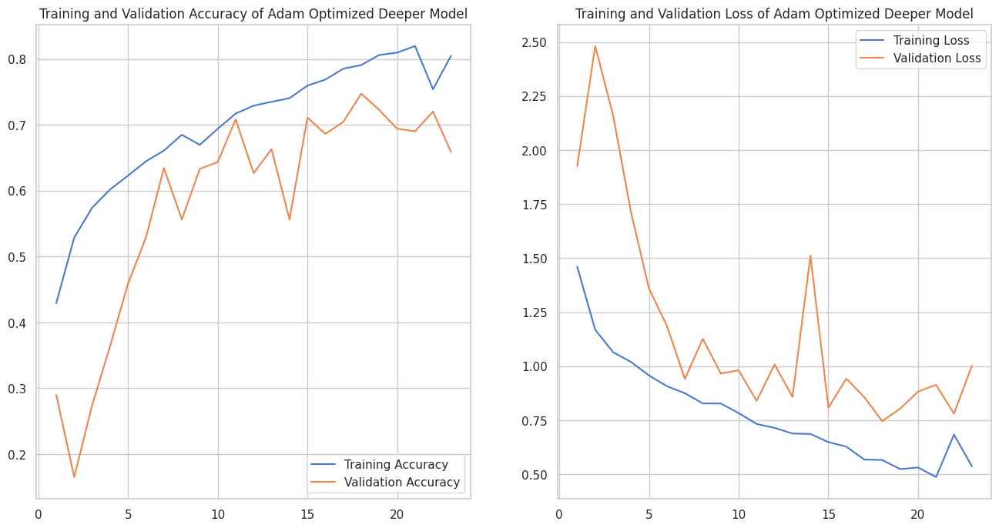

In [ ]:
# Plotting the train validation loss/accuracy
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy of Adam Optimized Deeper Model')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss of Adam Optimized Deeper Model')
plt.show()

In [ ]:
test_loss, test_accuracy = regularized_model.evaluate(val_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - accuracy: 0.6651 - loss: 0.9911
Test Loss: 1.0018624067306519
Test Accuracy: 0.6592977643013


14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - accuracy: 0.6340 - loss: 1.0250 
Test Loss: 1.0511959791183472
Test Accuracy: 0.6325581669807434
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


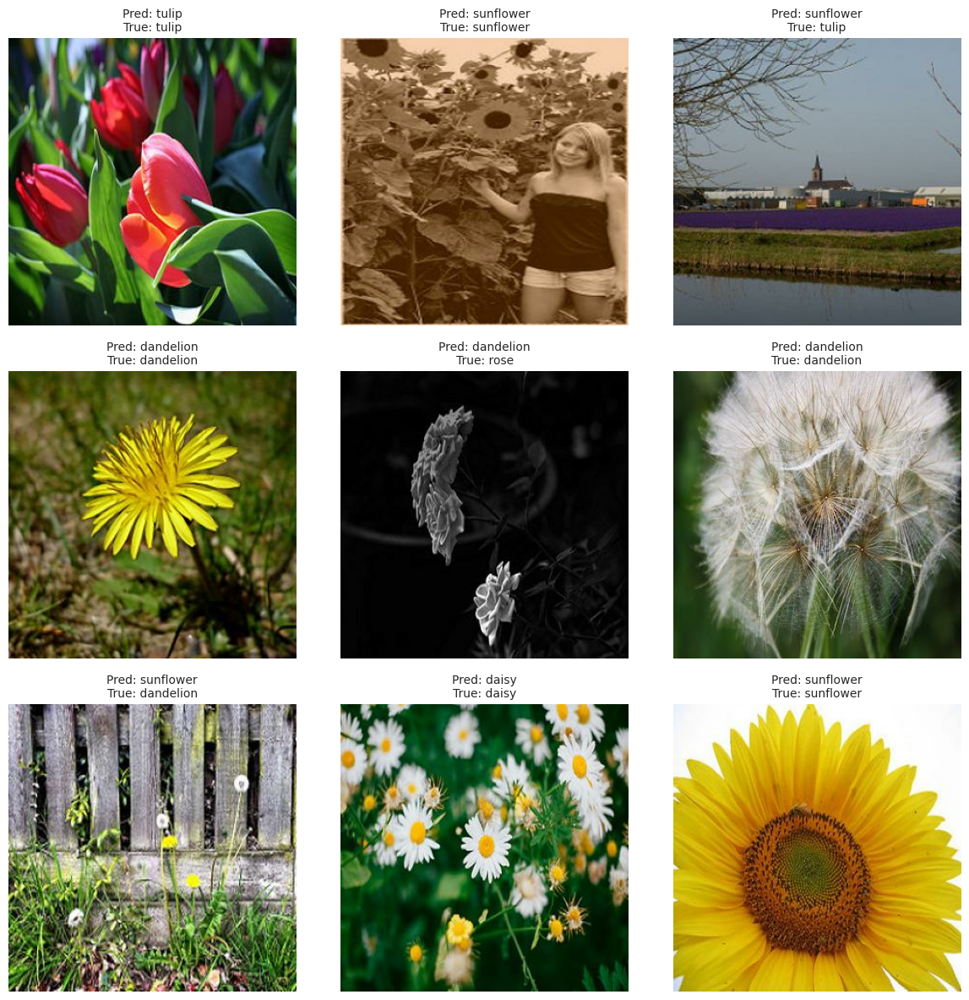

In [ ]:
# Predicting the resut on test datset
def predict_and_plot(model, dataset, class_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):
        # Predict the labels for the images
        predictions = model.predict(images)
        images = images.numpy()  # Convert images to NumPy arrays
        labels = labels.numpy()  # Convert labels to NumPy arrays

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].astype("uint8"))

            predicted_label = class_names[np.argmax(predictions[i])]

            # Ensure labels[i] is an integer index
            true_label_index = np.argmax(labels[i])
            true_label = class_names[true_label_index]  # Convert to integer index

            plt.title(f"Pred: {predicted_label}\nTrue: {true_label}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

# Evaluate the model on the test dataset
test_loss, test_accuracy = regularized_model.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Predict and plot examples from the test set
predict_and_plot(regularized_model, test_ds, class_names)


In [ ]:
regularized_model.save('regularized_cnn_adam.h5') # Saving the model

In [ ]:
loaded_model = keras.models.load_model('regularized_cnn_adam.h5')
print("Model loaded for predictions")

# Collect all test images and labels
all_images = []
all_labels = []
for images, labels in test_ds:
    all_images.append(images.numpy())
    all_labels.append(labels.numpy())

# Concatenate batches into single arrays
test_images = np.concatenate(all_images, axis=0)
test_labels_onehot = np.concatenate(all_labels, axis=0)

# Make predictions
predictions = loaded_model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_labels_onehot
if true_labels.ndim > 1:
    true_labels = np.argmax(true_labels, axis=1)


print(f"Class names: {class_names}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:\n", report)

Model loaded for predictions
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step
Class names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Report:
               precision    recall  f1-score   support

       daisy       0.71      0.51      0.60        76
   dandelion       0.75      0.66      0.70       105
        rose       0.56      0.77      0.65        78
   sunflower       0.93      0.38      0.54        73
       tulip       0.52      0.78      0.62        98

    accuracy                           0.63       430
   macro avg       0.69      0.62      0.62       430
weighted avg       0.69      0.63      0.63       430



## Model 3: Transfer Learning using RESNET50 model

In [ ]:
# Restructuring the dataset split with image size 256,256 to be compatible with Resnet 50 model
train_ds = train_ds = tf.keras.utils.image_dataset_from_directory(
resized_train_ds_path,
batch_size=32,
image_size=(256, 256),
shuffle=True,
seed=123,
validation_split=0.2,
subset="training",
)

Found 3847 files belonging to 5 classes.
Using 3078 files for training.


In [ ]:
# Reshaping the images in validation dataset to 256, 256
val_ds = train_ds = tf.keras.utils.image_dataset_from_directory(
resized_train_ds_path,
batch_size=32,
image_size=(256, 256),
shuffle=True,
seed=123,
validation_split=0.2,
subset="validation",
)

Found 3847 files belonging to 5 classes.
Using 769 files for validation.


In [ ]:
# Making encoding
train_ds = train_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))
val_ds = val_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))

In [ ]:
# Designing the model architecture to work with current dataset
resnet_model = Sequential()

pretrained_model= tf.keras.applications.ResNet50(include_top=False,
                   input_shape=(256,256,3),
                   pooling='avg',classes=5,
                   weights='imagenet')
for layer in pretrained_model.layers:
        layer.trainable=False

resnet_model.add(pretrained_model)
resnet_model.add(layers.Flatten())
resnet_model.add(layers.Dense(512, activation='relu'))
resnet_model.add(layers.Dropout(0.5)),
resnet_model.add(layers.BatchNormalization()),
resnet_model.add(layers.Dense(5, activation='softmax'))

In [ ]:
resnet_model.compile(optimizer=Adam(learning_rate=0.001),loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
resnet_model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,641,413 (94.00 MB)

 Trainable params: 1,052,677 (4.02 MB)

 Non-trainable params: 23,588,736 (89.98 MB)

In [ ]:
epochs=20
history = resnet_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 32s 797ms/step - accuracy: 0.5353 - loss: 1.2881 - val_accuracy: 0.8817 - val_loss: 0.3057
Epoch 2/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 22s 219ms/step - accuracy: 0.8651 - loss: 0.4113 - val_accuracy: 0.9441 - val_loss: 0.1580
Epoch 3/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 231ms/step - accuracy: 0.9337 - loss: 0.2293 - val_accuracy: 0.9844 - val_loss: 0.0899
Epoch 4/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - accuracy: 0.9451 - loss: 0.1734 - val_accuracy: 0.9935 - val_loss: 0.0603
Epoch 5/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 220ms/step - accuracy: 0.9694 - loss: 0.1209 - val_accuracy: 0.9948 - val_loss: 0.0523
Epoch 6/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 214ms/step - accuracy: 0.9699 - loss: 0.1146 - val_accuracy: 0.9987 - val_loss: 0.0414
Epoch 7/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 202ms/step - accuracy: 0.9817 - loss: 0.0801 - val_accuracy: 1.0000 - val_loss: 0.0337
Epoch 8/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - accuracy: 0.9857 - loss: 0.0728 - val_accuracy

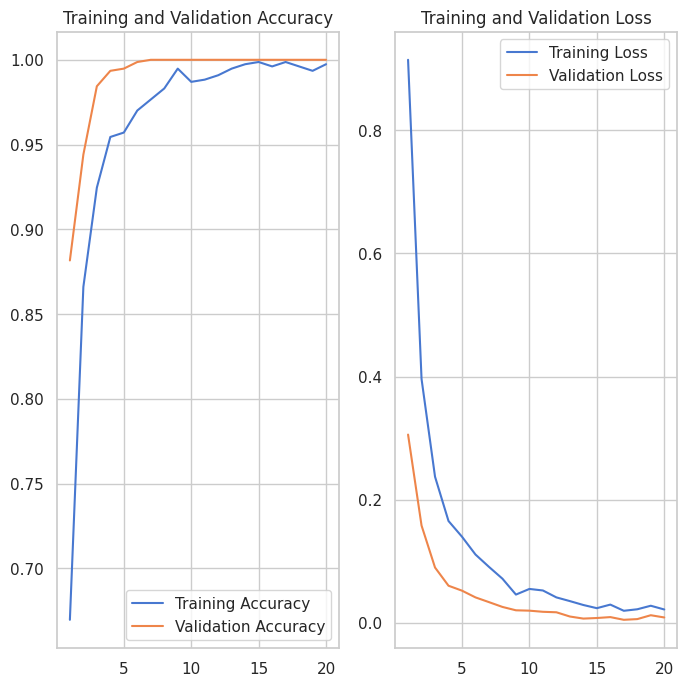

In [ ]:
# Model performance plot for, Fine tuned model
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjust the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
test_loss, test_accuracy = resnet_model.evaluate(val_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - accuracy: 1.0000 - loss: 0.0088 
Test Loss: 0.008794467896223068
Test Accuracy: 1.0


Found 430 files belonging to 5 classes.
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 290ms/step - accuracy: 0.8622 - loss: 0.4417
Test Loss: 0.4719253182411194
Test Accuracy: 0.8558139801025391
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


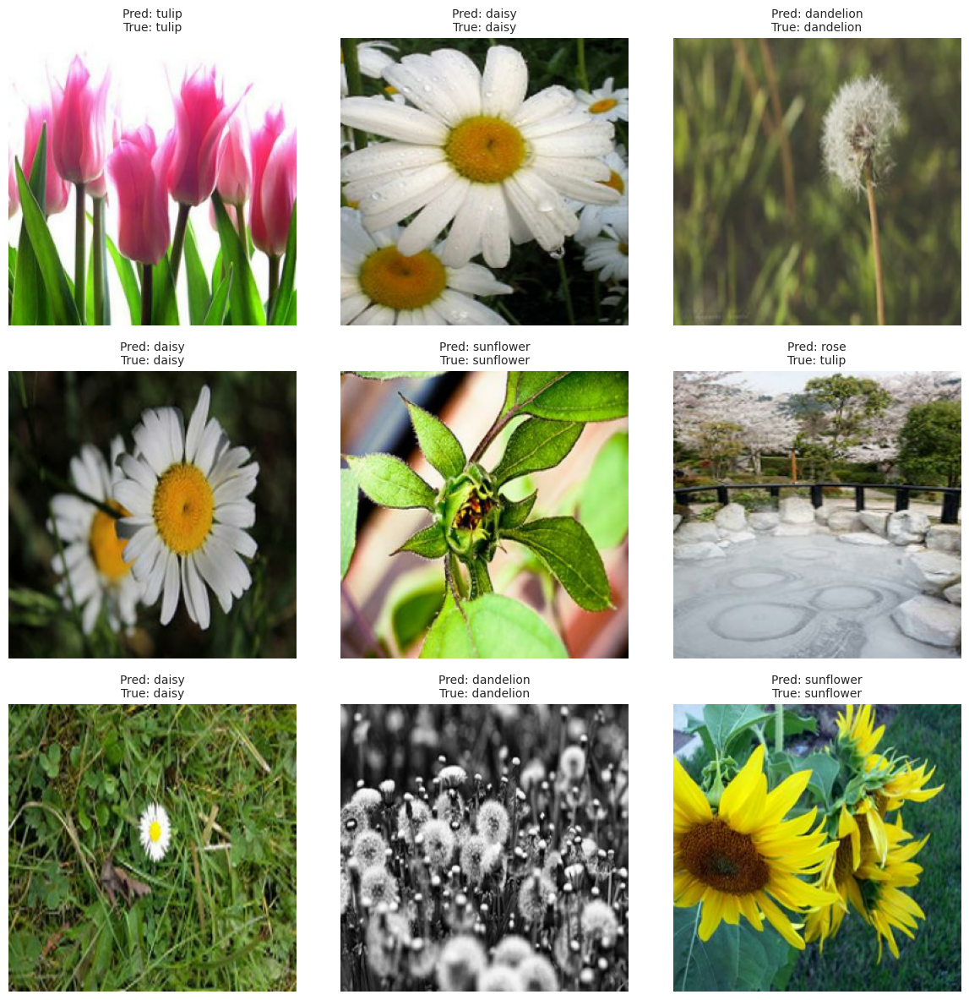

In [ ]:
# Making predictions with fine-tuned model
def predict_and_plot(model, dataset, class_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):
        # Predict the labels for the images
        predictions = model.predict(images)
        images = images.numpy()  # Convert images to NumPy arrays
        labels = labels.numpy()  # Convert labels to NumPy arrays

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].astype("uint8"))

            predicted_label = class_names[np.argmax(predictions[i])]

            # Ensure labels[i] is an integer index
            true_label_index = np.argmax(labels[i])
            true_label = class_names[true_label_index]  # Convert to integer index

            plt.title(f"Pred: {predicted_label}\nTrue: {true_label}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

# Create test dataset
test_dir = "/content/drive/MyDrive/Sem6/AI_ML/assignment_dataset/resized_Dataset/test"
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    batch_size=32,
    image_size=(256, 256),
    shuffle=True
)
# Convert test_ds labels to one-hot encoded format
test_ds = test_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))

# Evaluate the model on the test dataset
test_loss, test_accuracy = resnet_model.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Predict and plot examples from the test set
predict_and_plot(resnet_model, test_ds, class_names)


In [ ]:
resnet_model.save('resnet_model.h5')

In [ ]:
loaded_model = keras.models.load_model('resnet_model.h5')
print("Model loaded for predictions")

# Collect all test images and labels
all_images = []
all_labels = []
for images, labels in test_ds:
    all_images.append(images.numpy())
    all_labels.append(labels.numpy())

# Concatenate batches into single arrays
test_images = np.concatenate(all_images, axis=0)
test_labels_onehot = np.concatenate(all_labels, axis=0)

# Make predictions
predictions = loaded_model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_labels_onehot
if true_labels.ndim > 1:
    true_labels = np.argmax(true_labels, axis=1)


print(f"Class names: {class_names}")



# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:\n", report)

Model loaded for predictions
14/14 ━━━━━━━━━━━━━━━━━━━━ 10s 519ms/step
Class names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Report:
               precision    recall  f1-score   support

       daisy       0.87      0.78      0.82        76
   dandelion       0.89      0.89      0.89       105
        rose       0.72      0.91      0.81        78
   sunflower       0.90      0.84      0.87        73
       tulip       0.92      0.86      0.89        98

    accuracy                           0.86       430
   macro avg       0.86      0.85      0.85       430
weighted avg       0.86      0.86      0.86       430



THE END